#  INTRODUCTION

**1.0 OVERVIEW**

Brazil, officially the Federative Republic of Brazil, is the largest and easternmost country in South America and in Latin America. Brazil is the world's fifth-largest country by area and the seventh most populous. Its capital is Brasília, and its most populous city is São Paulo. The federation is composed of the union of the 26 states and the Federal District. It is the only country in the Americas to have Portuguese as an official language. Brazil is one of the most multicultural and ethnically diverse nations, due to over a century of mass immigration from around the world.

**1.0 AIM**

To use Moja-Global [land sector datasets](https://drive.google.com/drive/folders/1PZCVksHsuNyPzB9QTyraBSs1C7_c7W56) to come out with relevant data about Brazil.


# REPOSITORY

**2.0 IMPORT LIBARIES**

In [1]:
# Import all necessary libraries and load funtioncs used
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
%matplotlib inline
import geoplot as gplt 
import geoplot.crs as gcrs 
import folium

def get_df(link):    
    """
    Inputs a link to a json/geojson file 
    and returns the dataframe
    """
    try:
        return gpd.read_file(link)
    except Exception as e:
        print(e)
        print("Retrieving the Dataframe from url.")
        req = requests.get(link).content
        return gpd.read_file(io.StringIO(req.decode('utf-8')))


def plot_boundary(df, ax, color='none', edgecolor='black'):
    """
    Plots the administrative boundaries
    """
    df.plot(ax=ax, color=color, edgecolor=edgecolor)

    
def plot_feature(df, ax, column, edgecolor='black', cmap='tab20'):
    """
    Plots the features
    """
    df.plot(ax=ax, column=column, edgecolor=edgecolor, cmap=cmap, legend=True)
    
    
def clip_df(df_complete, df_n):
    """
    Clips the dataset to retain only the necessary data
    """
    return df_complete.clip(df_n)


def column_std(df):
    """
    Standardises column names
    """
    return df.columns.str.lower()

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


**ADMINISTRATION**

In [2]:
# load the dataset

bra_admin = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_AL2_Brazil_GEZ.json")
bra_all_states = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_ALL_states_GEZ.json")

#display the first 100 heads
bra_admin.head(100)
print("\n")

bra_all_states.head(100)
print("\n")

#display the shapes
bra_admin.shape
print("\n")

bra_all_states.shape
print("\n")

# view all the column titles in the dataframe
bra_admin.columns
print("\n")

bra_all_states.columns
print("\n")

# check the various data types
bra_admin.dtypes
print("\n")

bra_all_states.dtypes
print("\n")

# information about the dataframe
bra_admin.info()
print("\n")

bra_all_states.info()
print("\n")

# cirdinate system of the dataframe
bra_admin.crs
print("\n")

bra_all_states.crs
print("\n")

# geo-metric type of dataframe
bra_admin.geom_type
print("\n")

bra_all_states.geom_type
print("\n")

















<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   country     5 non-null      object  
 1   ISO3166_2   5 non-null      object  
 2   name        5 non-null      object  
 3   gez_name    5 non-null      object  
 4   gez_code    5 non-null      int64   
 5   gez_abbrev  5 non-null      object  
 6   adminlevel  5 non-null      int64   
 7   geometry    5 non-null      geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 448.0+ bytes


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   country     72 non-null     object  
 1   ISO3166_2   72 non-null     object  
 2   name        72 non-null     object  
 3   gez_name    72 non-null     object  
 4   gez_code    72 non-

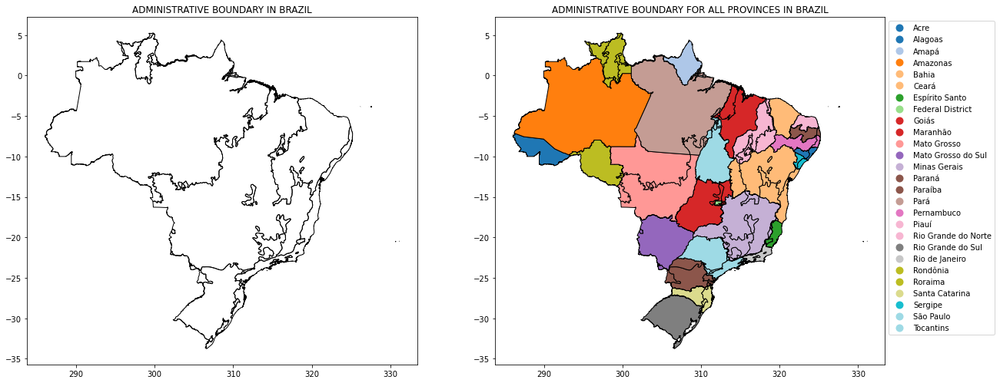

In [3]:
# display the boundary

# Create subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Plot the administrative boundary of Brazil in panel 1
bra_admin.plot(ax=ax1, color="none", edgecolor="black")
ax1.set_title("ADMINISTRATIVE BOUNDARY IN BRAZIL")

# Plot the administrative boundaries of all states in panel 2
bra_all_states.plot(ax=ax2,column="name", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("ADMINISTRATIVE BOUNDARY FOR ALL PROVINCES IN BRAZIL")

# Display plot
plt.show()
bra_admin.explore()

In [4]:
# Get the total area for Brazil and the largest state

# Replace EPSG:4326 with a projects CRS of 32642
projected_crs = "EPSG:32642"

# Re-project geometries to a projected CRS
bra_admin = bra_admin.to_crs(projected_crs)
print("\n")

bra_all_states = bra_all_states.to_crs(projected_crs)
print("\n")

# Get the total area of Brazil and the largest state in sqm of the new CRS
total_area = bra_admin["geometry"].area.sum()
print("\n")

bra_all_states["area"] = bra_all_states.geometry.area
print("\n")

print(f"Total Area: {total_area} sqm")
print("\n")

# Reproject geometries to original CRS for bra_admin and bra_all_states
original_crs = "EPSG:4326"
bra_admin = bra_admin.to_crs(original_crs)
print("\n")

bra_all_states = bra_all_states.to_crs(original_crs)
print("\n")









Total Area: 153359642876346.97 sqm








**BIOCLIMATIC AND ECOLOGICAL ZONES**

In [5]:
# Access global biodiversity hotspots
global_bio_div_hotspots = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Datasets/CI_BiodiversityHotspots.geojson")

# Extract information for Bras' biodiversity hotspots
bra_biohotspots = global_bio_div_hotspots.clip(bra_admin)
bra_biohotspots = bra_biohotspots.reset_index(drop=True)

#display the first 100 heads
global_bio_div_hotspots.head(100)
print("\n")

bra_biohotspots.head(100)
print("\n")

#display the shapes
global_bio_div_hotspots.shape
print("\n")

bra_biohotspots.shape
print("\n")

# view all the column titles in the dataframe
global_bio_div_hotspots.columns
print("\n")

bra_biohotspots.columns
print("\n")

# check the various data types
global_bio_div_hotspots.dtypes
print("\n")

bra_biohotspots.dtypes
print("\n")

# information about the dataframe
global_bio_div_hotspots.info()
print("\n")

bra_biohotspots.info()
print("\n")

# cirdinate system of the dataframe
global_bio_div_hotspots.crs
print("\n")

bra_biohotspots.crs
print("\n")

# geo-metric type of dataframe
global_bio_div_hotspots.geom_type
print("\n")

bra_biohotspots.geom_type
print("\n")

















<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID      53 non-null     int64   
 1   NAME          53 non-null     object  
 2   Type          53 non-null     object  
 3   Shape_Length  53 non-null     float64 
 4   Shape_Area    53 non-null     float64 
 5   geometry      53 non-null     geometry
dtypes: float64(2), geometry(1), int64(1), object(2)
memory usage: 2.6+ KB


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID      2 non-null      int64   
 1   NAME          2 non-null      object  
 2   Type          2 non-null      object  
 3   Shape_Length  2 non-null      float64 
 4   Shape_Area    2 non-null      float64 
 5   geometry      2 non-null

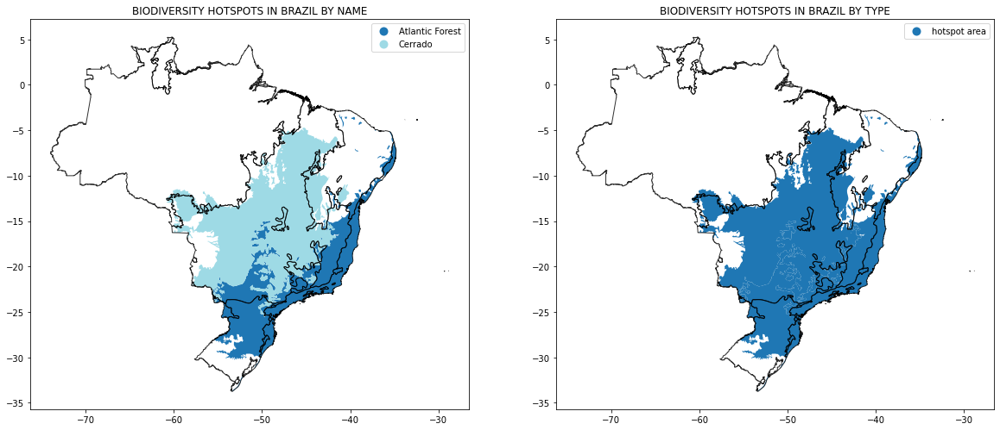

In [6]:
 # Create subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Plot the hotspots by name in panel 1
bra_biohotspots.plot(column="NAME", cmap="tab20", ax=ax1, legend=True)
bra_admin.plot(ax=ax1, color="none", edgecolor="black", alpha = 0.8)
ax1.set_title("BIODIVERSITY HOTSPOTS IN BRAZIL BY NAME")

# Plot the hotspots by type in panel 2
bra_biohotspots.plot(column="Type", cmap="tab20", ax=ax2, legend=True)
bra_admin.plot(ax=ax2, color="none", edgecolor="black", alpha = 0.8)
ax2.set_title("BIODIVERSITY HOTSPOTS IN BRAZIL BY TYPE")

# Display the plot
plt.show()

**ECOLOGICAL ZONES**

In [7]:
# load the dataset
bra_admin_gez = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_AL2_Brazil_GEZ.json")
bra_all_states_gez = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_ALL_states_GEZ.json")

# Check for unique value and their counts in the selected column
bra_admin_gez["gez_name"].value_counts()
print("\n")

bra_all_states_gez["gez_name"].value_counts()
print("\n")

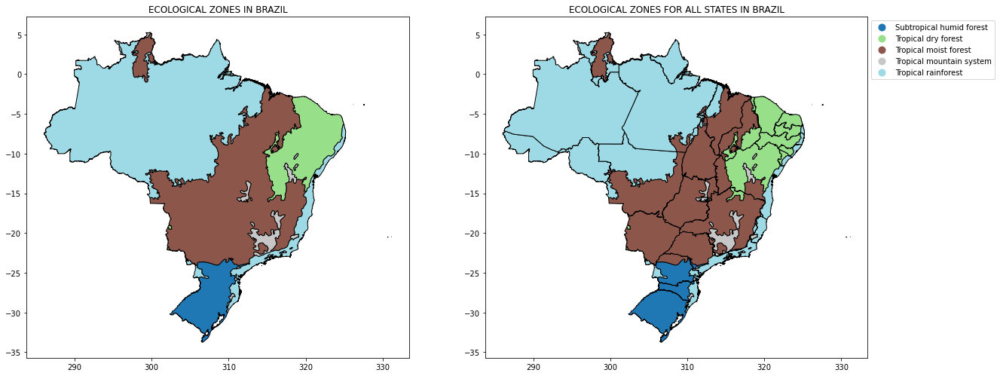

In [8]:
# Create subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Plot the ecological zones of Brazil in panel 1
bra_admin_gez.plot(ax=ax1, cmap="tab20", column="gez_name", edgecolor="black")
ax1.set_title("ECOLOGICAL ZONES IN BRAZIL")

# Plot the ecological zones of all states in panel 2
bra_all_states_gez.plot(ax=ax2,column="gez_name", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("ECOLOGICAL ZONES FOR ALL STATES IN BRAZIL")

# Display plot
plt.show()

**AGROECOLOGICAL ZONES**

In [9]:
# load the dataset
global_Agroeco_zones = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Datasets/GlobalAgroEcologicalZones_GAEZ.geojson")

# check the head
global_Agroeco_zones.head(100)
print("\n")

# check the rows and column
global_Agroeco_zones.shape
print("\n")

# check for unique values present
global_Agroeco_zones["Value"].unique()
print("\n")

In [10]:
# Fix the data and replace numbers with acgroecological zones
values = {"1": "Tropical-Arid", "2": "Tropical-Dry Semi-Arid", "3": "Tropical -Moist Semi-Arid", "4": "Tropical-Sub-Humid", "5": "Tropical-Humid", 
          "6": "Tropical-Humid (year round)", "7": "Temperate-Arid", "8": "Temperate-Dry Semi-Arid", "9": "Temperate-Moist Semi-Arid", 
          "10": "Temperate-Sub-Humid", "11": "Temperate-Humid", "12": "Temperate-Humid (year round)", "13": "Boreal-Arid", 
          "14": "Boreal-Dry Semi-Arid", "15": "Boreal-Moist Semi-Arid", "16": "Boreal-Sub-humid", "17": "Boreal-Humid", 
          "18": "Boreal-Humid (year round)"}\

# Standardize the column names
global_Agroeco_zones.columns = global_Agroeco_zones.columns.str.lower()

# Rename class name
global_Agroeco_zones.value = global_Agroeco_zones.value.astype("str").replace(values)

# Check to see replaced values
global_Agroeco_zones.head(100)

,value,geometry
0,Tropical-Arid,"POLYGON ((-33.50000 83.65000, -33.50000 83.500..."
1,Tropical-Arid,"POLYGON ((-37.85000 83.60000, -37.85000 83.500..."
2,Tropical-Arid,"POLYGON ((-32.35000 83.60000, -32.35000 83.500..."
3,Tropical-Arid,"POLYGON ((-31.25000 83.60000, -31.25000 83.500..."
4,Tropical-Arid,"POLYGON ((-34.25000 83.60000, -34.25000 83.500..."
...,...,...
95,Tropical-Arid,"POLYGON ((-70.25000 82.85000, -70.25000 82.650..."
96,Tropical-Dry Semi-Arid,"POLYGON ((-67.25000 82.85000, -67.25000 82.750..."
97,Tropical-Dry Semi-Arid,"POLYGON ((-66.90000 82.85000, -66.90000 82.750..."
98,Tropical-Arid,"POLYGON ((-66.60000 82.90000, -66.60000 82.850..."


In [11]:
# Extract Brazil's agroecological zones
bra_Agroeco_zones = global_Agroeco_zones.clip(bra_admin)
bra_Agroeco_zones = bra_Agroeco_zones.reset_index(drop=True)

#display the first 100 heads
bra_Agroeco_zones.head(100)
print("\n")

#display the shapes
bra_Agroeco_zones.shape
print("\n")

# view all the column titles in the dataframe
bra_Agroeco_zones.columns
print("\n")

# check the various data types
bra_Agroeco_zones.dtypes
print("\n")

# information about the dataframe
bra_Agroeco_zones.info()
print("\n")

# cirdinate system of the dataframe
bra_Agroeco_zones.crs
print("\n")

# geo-metric type of dataframe
bra_Agroeco_zones.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_Agroeco_zones["value"].value_counts()
print("\n")









<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2965 entries, 0 to 2964
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   value     2965 non-null   object  
 1   geometry  2965 non-null   geometry
dtypes: geometry(1), object(1)
memory usage: 46.5+ KB










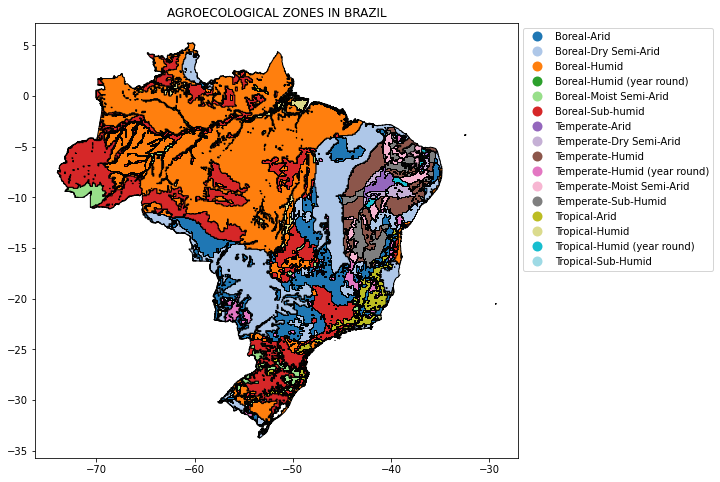

In [12]:
# Create plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the agroecological zones
bra_Agroeco_zones.plot(ax=ax, cmap="tab20", column="value", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("AGROECOLOGICAL ZONES IN BRAZIL")

# Display plot
plt.show()

**HOLDRIDGE LIFEZONES**

In [13]:
#load the data
holdridge_zones = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Datasets/HoldridgeLifeZones.json")

# Extract Brazil's holdridge zones
bra_holdridge_zones = holdridge_zones.clip(bra_admin)
bra_holdridge_zones = bra_holdridge_zones.reset_index(drop=True)

#display the first 100 heads
holdridge_zones.head(100)
print("\n")

#display the first 100 heads
bra_holdridge_zones.head(100)
print("\n")

#display the shapes
bra_holdridge_zones.shape
print("\n")

# view all the column titles in the dataframe
bra_holdridge_zones.columns
print("\n")

# check the various data types
bra_holdridge_zones.dtypes
print("\n")

# information about the dataframe
bra_holdridge_zones.info()
print("\n")

# cirdinate system of the dataframe
bra_holdridge_zones.crs
print("\n")

# geo-metric type of dataframe
bra_holdridge_zones.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_holdridge_zones["DESC"].value_counts()
print("\n")











<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   FID         73 non-null     int64   
 1   AREA        73 non-null     float64 
 2   PERIMETER   73 non-null     int64   
 3   HOLDRIG_    73 non-null     int64   
 4   HOLDRIG_ID  73 non-null     int64   
 5   ZONE        73 non-null     int64   
 6   CASE_       73 non-null     int64   
 7   FREQUENCY   73 non-null     int64   
 8   DESC        73 non-null     object  
 9   SYMBOL      73 non-null     int64   
 10  geometry    73 non-null     geometry
dtypes: float64(1), geometry(1), int64(8), object(1)
memory usage: 6.4+ KB










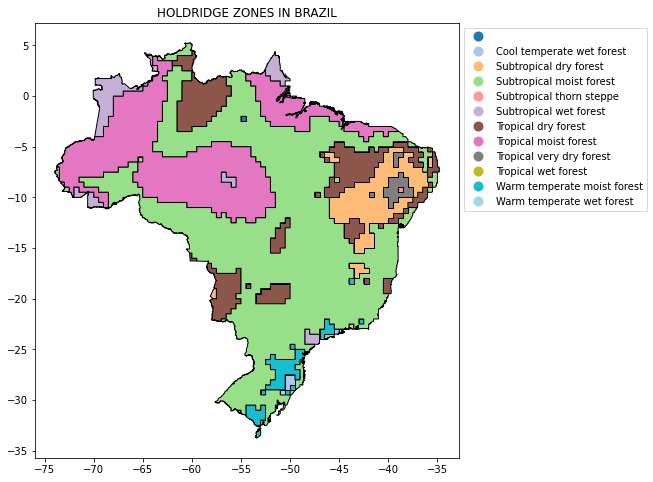

In [14]:
# Create plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Brazil's holdridge life zones
bra_holdridge_zones.plot(ax=ax, cmap="tab20", column="DESC", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("HOLDRIDGE ZONES IN BRAZIL")

# Display plot
plt.show()

**TERRESTRAL ECOREGIONS**

In [15]:
#load the data
terr_eco_zones = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Datasets/TerrestrialEcoregionsoftheWorld_WWF.geojson")

# Extract Brazil's Terrestral zones
bra_terr_eco_zones = terr_eco_zones.clip(bra_admin)
bra_terr_eco_zones = bra_terr_eco_zones.reset_index(drop=True)

#display the first 100 heads
terr_eco_zones.head(100)
print("\n")

#display the first 100 heads
bra_terr_eco_zones.head(100)
print("\n")

#display the shapes
bra_terr_eco_zones.shape
print("\n")

# view all the column titles in the dataframe
bra_terr_eco_zones.columns
print("\n")

# check the various data types
bra_terr_eco_zones.dtypes
print("\n")

# information about the dataframe
bra_terr_eco_zones.info()
print("\n")

# cirdinate system of the dataframe
bra_terr_eco_zones.crs
print("\n")

# geo-metric type of dataframe
bra_terr_eco_zones.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_terr_eco_zones["ECO_NAME"].value_counts()
print("\n")











<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 502 entries, 0 to 501
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID_1    502 non-null    int64   
 1   OBJECTID      502 non-null    int64   
 2   AREA          502 non-null    float64 
 3   ECO_NAME      502 non-null    object  
 4   REALM         502 non-null    object  
 5   BIOME         502 non-null    int64   
 6   ECO_NUM       502 non-null    int64   
 7   ECO_ID        502 non-null    int64   
 8   ECO_SYM       502 non-null    int64   
 9   GBL_STAT      502 non-null    int64   
 10  G200_REGIO    502 non-null    object  
 11  G200_NUM      502 non-null    int64   
 12  G200_BIOME    502 non-null    int64   
 13  G200_STAT     502 non-null    int64   
 14  area_km2      502 non-null    int64   
 15  eco_code      502 non-null    object  
 16  BIOME_1       502 non-null    object  
 17  GBL_STAT_1    502 non-null    object

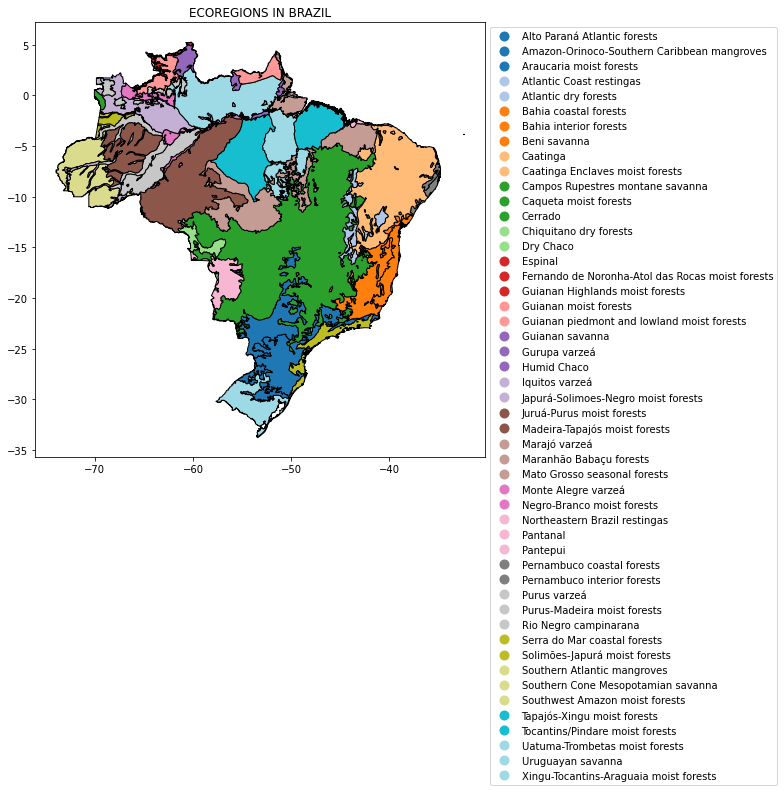

In [16]:
# Create plot for ecoregions
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Brazils's terrestial ecoregions
bra_terr_eco_zones.plot(ax=ax, cmap="tab20", column="ECO_NAME", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("ECOREGIONS IN BRAZIL")

# Display plot
plt.show()

**SOIL**

In [17]:
#load the data
bra_soil = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_AL2_Brazil_WSR.json")

#display the first 100 heads
bra_soil.head(100)
print("\n")

#display the first 100 heads
bra_soil.head(100)
print("\n")

#display the shapes
bra_soil.shape
print("\n")

# view all the column titles in the dataframe
bra_soil.columns
print("\n")

# check the various data types
bra_soil.dtypes
print("\n")

# information about the dataframe
bra_soil.info()
print("\n")

# cirdinate system of the dataframe
bra_soil.crs
print("\n")

# geo-metric type of dataframe
bra_soil.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_soil["IPCC"].value_counts()
print("\n")











<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   country     15 non-null     object  
 1   ISO3166_2   15 non-null     object  
 2   name        15 non-null     object  
 3   SNAME       15 non-null     object  
 4   mg_code     15 non-null     int64   
 5   IPCC        15 non-null     object  
 6   adminlevel  15 non-null     int64   
 7   geometry    15 non-null     geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 1.1+ KB










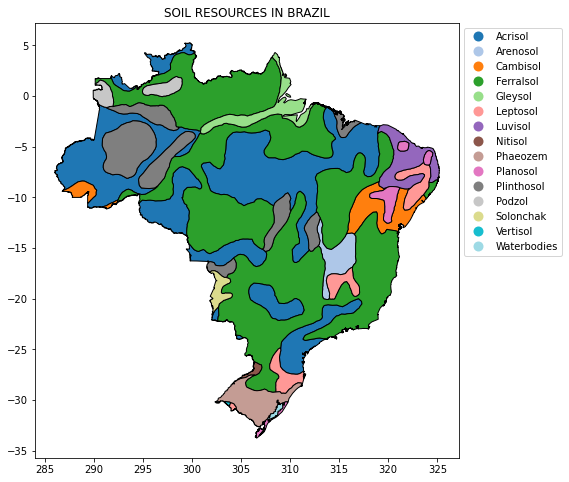

In [18]:
# Create plot for soil resources
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Brazils's soil resoucrces
bra_soil.plot(ax=ax, cmap="tab20", column="IPCC", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("SOIL RESOURCES IN BRAZIL")

# Display plot
plt.show()

**CLIMATE**

In [19]:
# load datasets
world_climate_zones = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Datasets/IPCC_ClimateZoneMap_Vector.geojson")

# Extract Brazil's Climatic zones
bra_world_climate_zones = world_climate_zones.clip(bra_admin)
bra_world_climate_zones = bra_world_climate_zones.reset_index(drop=True)

#display the first 100 heads
world_climate_zones.head(100)
print("\n")

#display the first 100 heads
bra_world_climate_zones.head(100)
print("\n")

#display the shapes
bra_world_climate_zones.shape
print("\n")

# view all the column titles in the dataframe
bra_world_climate_zones.columns
print("\n")

# check the various data types
bra_world_climate_zones.dtypes
print("\n")

# information about the dataframe
bra_world_climate_zones.info()
print("\n")

# cirdinate system of the dataframe
bra_world_climate_zones.crs
print("\n")

# geo-metric type of dataframe
bra_world_climate_zones.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_world_climate_zones["CLASS_NAME"].value_counts()
print("\n")











<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   CLASS_NAME  416 non-null    int64   
 1   geometry    416 non-null    geometry
dtypes: geometry(1), int64(1)
memory usage: 6.6 KB










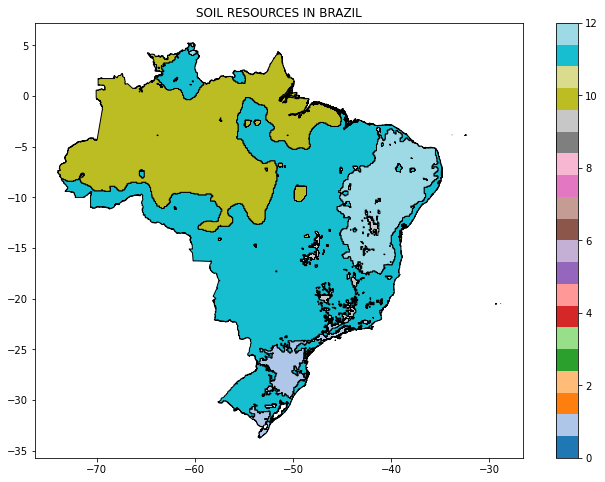

In [20]:
#  Create plot for soil resources
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Brazil's soil resoucrces
bra_world_climate_zones.plot(ax=ax, cmap="tab20", column="CLASS_NAME", legend=True, edgecolor="black")
ax.set_title("SOIL RESOURCES IN BRAZIL")

# Display plot
plt.show()

**FOREST COVER**

In [ ]:
# load dataset
bra_forest = gpd.read_file("file:///home/anonymous/FLINT/Outreachy_May_2024_contributions/Week_one/Datasets/BRA_Brazil_SDPT.json")

#display the first 100 heads
bra_forest.head(100)
print("\n")

#display the shapes
bra_forest.shape
print("\n")

# view all the column titles in the dataframe
bra_forest.columns
print("\n")

# check the various data types
bra_forest.dtypes
print("\n")

# information about the dataframe
bra_forest.info()
print("\n")

# cirdinate system of the dataframe
bra_forest.crs
print("\n")

# geo-metric type of dataframe
bra_forest.geom_type
print("\n")

# Check for unique value and their counts in the selected column
bra_forest["CLASS_NAME"].value_counts()
print("\n")

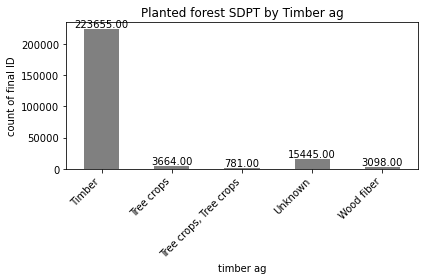

In [28]:
# Group by 'timber_ag' and sum 'final_id'
type_area_sum = bra_forest.groupby('timber_ag')['final_id'].count()

# Create a bar graph
type_area_sum.plot(kind='bar', color='grey')
plt.title('Planted forest SDPT by Timber ag')
plt.xlabel('timber ag')
plt.ylabel('count of final ID')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Add total values on top of the bars
for i, v in enumerate(type_area_sum):
    plt.text(i, v, f'{v:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

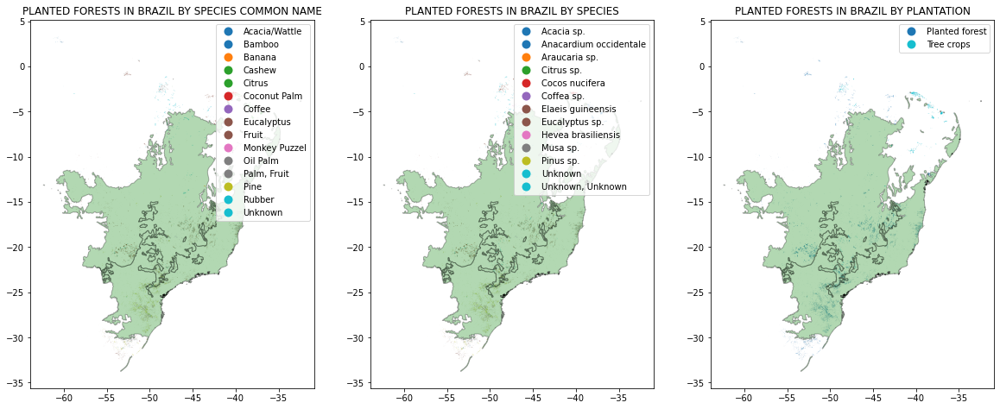

In [29]:
# Create subplot with three panels
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))

# Plot the hotspots by name in panel 1
bra_forest.plot(column="common_name", cmap="tab10", ax=ax1, legend=True)
bra_biohotspots.plot(ax=ax1, color="green", edgecolor="black", alpha = 0.3)
ax1.set_title("PLANTED FORESTS IN BRAZIL BY SPECIES COMMON NAME")

# Plot the planted forests by type in panel 2
bra_forest.plot(column="species", cmap="tab10", ax=ax2, legend=True)
bra_biohotspots.plot(ax=ax2, color="green", edgecolor="black", alpha = 0.3)
ax2.set_title("PLANTED FORESTS IN BRAZIL BY SPECIES")

# Plot the planted forests by plantation in panel 3
bra_forest.plot(column="plant_ag", cmap="tab10", ax=ax3, legend=True)
bra_biohotspots.plot(ax=ax3, color="green", edgecolor="black", alpha = 0.3)
ax3.set_title("PLANTED FORESTS IN BRAZIL BY PLANTATION")

plt.show()

# Conclusion

Brazil's diverse landscape and rich cultural heritage are matched by its significant environmental and economic challenges. This analysis has underscored the importance of sustainable development and social equity in ensuring the country's progress. As Brazil navigates its path towards a more inclusive and environmentally responsible future, its actions will not only shape the well-being of its own citizens but also have a lasting impact on the global community.

**REFERENCES**

- [Department of Economic and Social Affairs Sustainable Development](https://sdgs.un.org/goals)
- [What is geodata used for](https://www.heavy.ai/technical-glossary/geodata#:~:text=The%20application%20of%20geographic%20data,and%20repair%20of%20network%20anomalies%2C)
- [GDAL documentation](https://gdal.org/api/python_bindings.html)
- [Land Sector Datasets](https://drive.google.com/drive/folders/1PZCVksHsuNyPzB9QTyraBSs1C7_c7W56)
- [Brazil](https://en.wikipedia.org/wiki/Brazil)